In [1]:
from datasets import load_dataset
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from scipy.stats import hmean, norm
from pylab import *

In [3]:
from bokeh.plotting import figure
from bokeh.io import output_notebook, show
from bokeh.models import LinearColorMapper
from bokeh.models import HoverTool

In [4]:
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

In [5]:
data= load_dataset("imdb", split= "test")

Reusing dataset imdb (/home/sasha/.cache/huggingface/datasets/imdb/plain_text/1.0.0/e3c66f1788a67a89c7058d97ff62b6c30531e05b549de56d3ab91891f0561f9a)


In [6]:
datadf = pd.json_normalize(data)

#### Looking at the top rows

In [ ]:
datadf.head()

0    ({'original': 'Adjacent counties are Marin (to...
Name: validation, dtype: object

#### Getting more information

In [8]:
datadf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    25000 non-null  object
 1   label   25000 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 390.8+ KB


#### Checking for missing values

In [9]:
datadf[datadf.isnull().any(axis=1)].head()

,text,label


In [10]:
np.sum(datadf.isnull().any(axis=1))

0

#### Count vocab size + frequencies

In [11]:
cvec = CountVectorizer()
cvec.fit(datadf.text)

CountVectorizer()

In [12]:
len(cvec.get_feature_names())

73822

In [13]:
document_matrix = cvec.transform(datadf.text)

In [14]:
datadf[datadf.label == 0].tail()

,text,label
24995,I occasionally let my kids watch this garbage ...,0
24996,When all we have anymore is pretty much realit...,0
24997,The basic genre is a thriller intercut with an...,0
24998,Four things intrigued me as to this film - fir...,0
24999,David Bryce's comments nearby are exceptionall...,0


In [15]:
#Code from https://towardsdatascience.com/another-twitter-sentiment-analysis-with-python-part-2-333514854913

In [16]:
%%time
neg_batches = np.linspace(12500,24999,100).astype(int)
i=0
neg_tf = []
while i < len(neg_batches)-1:
    batch_result = np.sum(document_matrix[neg_batches[i]:neg_batches[i+1]].toarray(),axis=0)
    neg_tf.append(batch_result)
    if (i % 10 == 0) | (i == len(neg_batches)-2):
        print(neg_batches[i+1],"entries' term frequency calculated")
    i += 1

12626 entries' term frequency calculated
13888 entries' term frequency calculated
15151 entries' term frequency calculated
16413 entries' term frequency calculated
17676 entries' term frequency calculated
18938 entries' term frequency calculated
20201 entries' term frequency calculated
21463 entries' term frequency calculated
22726 entries' term frequency calculated
23988 entries' term frequency calculated
24999 entries' term frequency calculated
CPU times: user 1.13 s, sys: 1.27 s, total: 2.4 s
Wall time: 2.39 s


In [17]:
datadf[datadf.label == 1].tail()

,text,label
12495,I was extraordinarily impressed by this film. ...,1
12496,"Although I'm not a golf fan, I attended a snea...",1
12497,"From the start of ""The Edge Of Love"", the view...",1
12498,"This movie, with all its complexity and subtle...",1
12499,I've seen this story before but my kids haven'...,1


In [18]:
%%time
pos_batches = np.linspace(0,12499,100).astype(int)
i=0
pos_tf = []
while i < len(pos_batches)-1:
    batch_result = np.sum(document_matrix[pos_batches[i]:pos_batches[i+1]].toarray(),axis=0)
    pos_tf.append(batch_result)
    if (i % 10 == 0) | (i == len(pos_batches)-2):
        print(pos_batches[i+1],"entries' term frequency calculated")
    i += 1

126 entries' term frequency calculated
1388 entries' term frequency calculated
2651 entries' term frequency calculated
3913 entries' term frequency calculated
5176 entries' term frequency calculated
6438 entries' term frequency calculated
7701 entries' term frequency calculated
8963 entries' term frequency calculated
10226 entries' term frequency calculated
11488 entries' term frequency calculated
12499 entries' term frequency calculated
CPU times: user 1.08 s, sys: 1.28 s, total: 2.37 s
Wall time: 2.36 s


In [19]:
neg = np.sum(neg_tf,axis=0)
pos = np.sum(pos_tf,axis=0)
term_freq_df = pd.DataFrame([neg,pos],columns=cvec.get_feature_names()).transpose()
term_freq_df.head()

,0,1
00,54,61
000,172,147
00000000000,2,0
00000001,1,0
000dm,1,0


In [20]:
term_freq_df.columns = ['negative', 'positive']
term_freq_df['total'] = term_freq_df['negative'] + term_freq_df['positive']
term_freq_df.sort_values(by='total', ascending=False).iloc[:25]

,negative,positive,total
the,163291,167923,331214
and,73393,86879,160272
of,68291,75245,143536
to,67823,64567,132390
is,49158,54580,103738
br,51361,48719,100080
it,47328,47058,94386
in,43767,49027,92794
this,40428,34558,74986
that,36640,33947,70587


In [21]:
#Code from https://towardsdatascience.com/another-twitter-sentiment-analysis-with-python-part-3-zipfs-law-data-visualisation-fc9eadda71e7

In [22]:
term_freq_df.shape

(73822, 3)

#### I tried running it on all tokens, but it makes my computer crash...

Text(0.5, 1.0, "Top 500 tokens in IMDB reviews, with Zipf's law in dotted red")

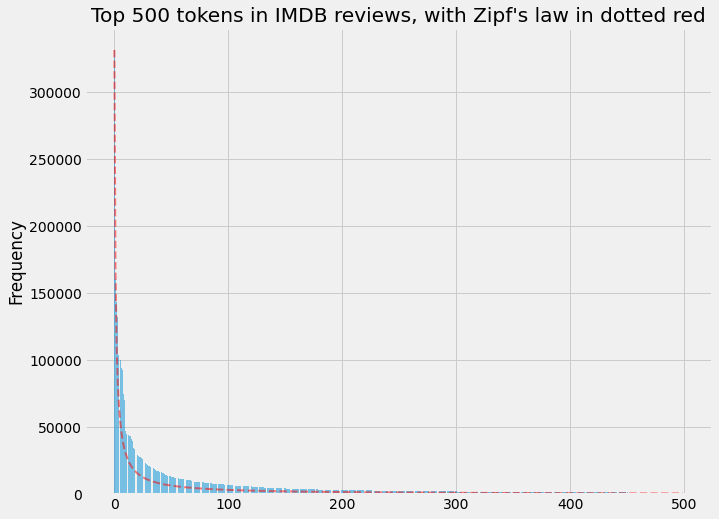

In [ ]:
y_pos = np.arange(500)
plt.figure(figsize=(10,8))
s = 1
expected_zipf = [term_freq_df.sort_values(by='total', ascending=False)['total'][0]/(i+1)**s for i in y_pos]
plt.bar(y_pos, term_freq_df.sort_values(by='total', ascending=False)['total'][:500], align='center', alpha=0.5)
plt.plot(y_pos, expected_zipf, color='r', linestyle='--',linewidth=2,alpha=0.5)
plt.ylabel('Frequency')
plt.title("Top 500 tokens in IMDB reviews, with Zipf's law in dotted red")

#### This is currently giving weird results:

In [ ]:
counts = term_freq_df.total
tokens = term_freq_df.index
ranks = arange(1, len(counts)+1)
indices = argsort(-counts)
frequencies = counts[indices]
plt.figure(figsize=(8,6))
plt.ylim(1,10**6)
plt.xlim(1,10**6)
loglog(ranks, frequencies, marker=".")
plt.plot([1,frequencies[0]],[frequencies[0],1],color='r')
title("Zipf plot for review tokens")
xlabel("Frequency rank of token")
ylabel("Absolute frequency of token")
grid(True)
for n in list(logspace(-0.5, log10(len(counts)-2), 25).astype(int)):
    dummy = text(ranks[n], frequencies[n], " " + tokens[indices[n]], 
                 verticalalignment="bottom",
                 horizontalalignment="left")

In [26]:
datadf[datadf['text'].str.contains("ruptures")]

,text,label
24999,David Bryce's comments nearby are exceptionall...,0


In [59]:
neg = np.sum(neg_tf,axis=0)
pos = np.sum(pos_tf,axis=0)
term_freq_df2 = pd.DataFrame([neg,pos],columns=cvec.get_feature_names()).transpose()
term_freq_df2.columns = ['negative', 'positive']
term_freq_df2['total'] = term_freq_df2['negative'] + term_freq_df2['positive']
term_freq_df2.sort_values(by='total', ascending=False).iloc[:10]

,negative,positive,total
the,163291,167923,331214
and,73393,86879,160272
of,68291,75245,143536
to,67823,64567,132390
is,49158,54580,103738
br,51361,48719,100080
it,47328,47058,94386
in,43767,49027,92794
this,40428,34558,74986
that,36640,33947,70587


Text(0.5, 1.0, 'Top 50 tokens in negative reviews')

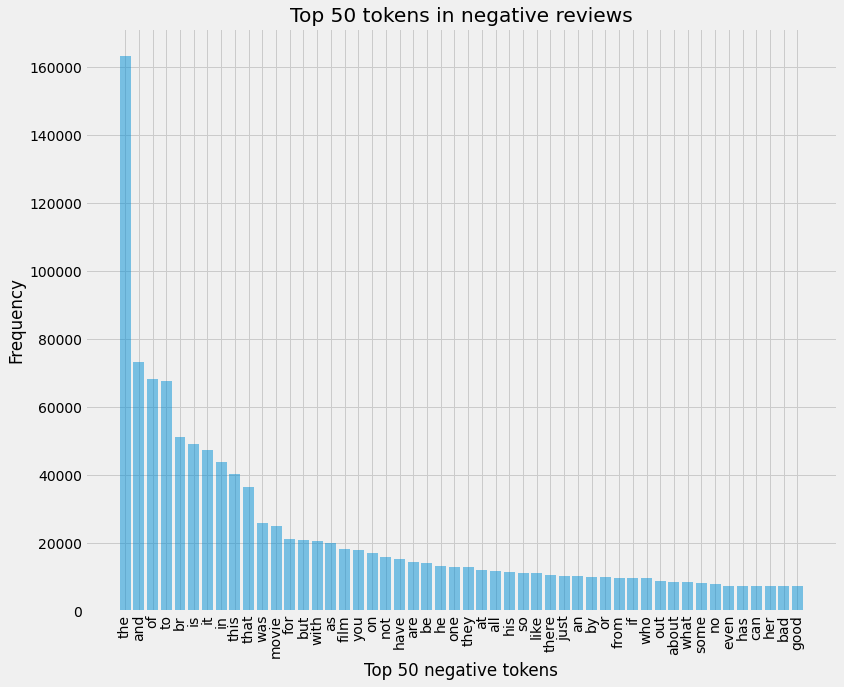

In [60]:
y_pos = np.arange(50)
plt.figure(figsize=(12,10))
plt.bar(y_pos, term_freq_df2.sort_values(by='negative', ascending=False)['negative'][:50], align='center', alpha=0.5)
plt.xticks(y_pos, term_freq_df2.sort_values(by='negative', ascending=False)['negative'][:50].index,rotation='vertical')
plt.ylabel('Frequency')
plt.xlabel('Top 50 negative tokens')
plt.title('Top 50 tokens in negative reviews')

### I honestly don't know if any of the stuff below is really useful

#### Maybe to show which words only appear in certain labels? (e.g. "kurds" seems to only appear in positive reviews in this dataset)

In [63]:
term_freq_df2['pos_rate'] = term_freq_df2['positive'] * 1./term_freq_df2['total']
term_freq_df2.sort_values(by='pos_rate', ascending=False).iloc[:10]

,negative,positive,total,pos_rate
kurds,0,2,2,1.0
eatery,0,2,2,1.0
presaging,0,1,1,1.0
preschooler,0,1,1,1.0
eavesdropping,0,5,5,1.0
eavesdropper,0,1,1,1.0
eavesdrop,0,1,1,1.0
eau,0,1,1,1.0
prescribe,0,2,2,1.0
eatons,0,1,1,1.0


In [67]:
for t in datadf.text[datadf['text'].str.contains("Kurds")]:
    print(t)

First of all, I should point out that I really enjoyed watching this documentary. Not only it had great music in it, but the shots and the editing were also wonderful. However, all these positive things about the film does not change the fact that it plays to the orientalist "East meets West" cliché that bothers many Turks like myself. Okay, this film tells the story of traditional and contemporary Turkish music in a very stylish manner which is a good thing, something that would show ignorant Europeans and Americans that this country is not just about murdering Armenians and Kurds. However, the problematic of the film is that it looks at what it defines as "east" from the eyes of the "west". I mean, like one jazz musician says in the film, maybe there is no east and west, maybe it is just a myth, a lie created by the ruling leaders of "western" countries in order to keep fear and hostility alive so that they could continue ruling the world and "keep the cash flowing"? <br /><br />Why 

In [51]:
term_freq_df2['pos_freq_pct'] = term_freq_df2['positive'] * 1./term_freq_df2['positive'].sum()
term_freq_df2.sort_values(by='pos_freq_pct', ascending=False).iloc[:10]

,negative,positive,total,pos_rate,pos_freq_pct
the,163291,167923,331214,0.506992,0.060369
and,73393,86879,160272,0.542072,0.031233
of,68291,75245,143536,0.524224,0.027051
to,67823,64567,132390,0.487703,0.023212
is,49158,54580,103738,0.526133,0.019622
in,43767,49027,92794,0.528342,0.017625
br,51361,48719,100080,0.486801,0.017515
it,47328,47058,94386,0.498570,0.016917
this,40428,34558,74986,0.460859,0.012424
that,36640,33947,70587,0.480924,0.012204


In [52]:
term_freq_df2['pos_hmean'] = term_freq_df2.apply(lambda x: (harmonic_mean([x['pos_rate'], x['pos_freq_pct']])                                                               if x['pos_rate'] > 0 and x['pos_freq_pct'] > 0 else 0), axis=1)
                                                       
term_freq_df2.sort_values(by='pos_hmean', ascending=False).iloc[:10]

,negative,positive,total,pos_rate,pos_freq_pct,pos_hmean
the,163291,167923,331214,0.506992,0.060369,0.107890
and,73393,86879,160272,0.542072,0.031233,0.059063
of,68291,75245,143536,0.524224,0.027051,0.051447
to,67823,64567,132390,0.487703,0.023212,0.044315
is,49158,54580,103738,0.526133,0.019622,0.037832
in,43767,49027,92794,0.528342,0.017625,0.034113
br,51361,48719,100080,0.486801,0.017515,0.033813
it,47328,47058,94386,0.498570,0.016917,0.032724
this,40428,34558,74986,0.460859,0.012424,0.024195
that,36640,33947,70587,0.480924,0.012204,0.023804


In [36]:
def normcdf(x):
    return norm.cdf(x, x.mean(), x.std())

In [53]:
np.sum(term_freq_df2.isnull().any(axis=1))

3

In [54]:
term_freq_df2.dropna(inplace=True)

In [55]:
term_freq_df2['pos_rate_normcdf'] = normcdf(term_freq_df2['pos_rate'])
term_freq_df2['pos_freq_pct_normcdf'] = normcdf(term_freq_df2['pos_freq_pct'])
term_freq_df2['pos_normcdf_hmean'] = hmean([term_freq_df2['pos_rate_normcdf'], term_freq_df2['pos_freq_pct_normcdf']])
term_freq_df2.sort_values(by='pos_normcdf_hmean',ascending=False).iloc[:10]

,negative,positive,total,pos_rate,pos_freq_pct,pos_hmean,pos_rate_normcdf,pos_freq_pct_normcdf,pos_normcdf_hmean
excellent,356,1676,2032,0.824803,0.000603,0.001204,0.788902,0.957271,0.864969
wonderful,265,1296,1561,0.830237,0.000466,0.000931,0.792937,0.906740,0.846028
great,2539,6545,9084,0.720498,0.002353,0.004691,0.703043,1.000000,0.825631
war,656,1742,2398,0.726439,0.000626,0.001251,0.708332,0.963204,0.816337
perfect,364,1192,1556,0.766067,0.000429,0.000857,0.742440,0.887199,0.808390
loved,345,1152,1497,0.769539,0.000414,0.000828,0.745327,0.878954,0.806644
beautiful,582,1460,2042,0.714985,0.000525,0.001049,0.698096,0.932295,0.798375
best,2006,4190,6196,0.676243,0.001506,0.003006,0.662338,0.999993,0.796873
amazing,254,945,1199,0.788157,0.000340,0.000679,0.760512,0.829572,0.793542
love,2164,4388,6552,0.669719,0.001577,0.003148,0.656158,0.999998,0.792385


In [56]:
term_freq_df2['neg_rate'] = term_freq_df2['negative'] * 1./term_freq_df2['total']
term_freq_df2['neg_freq_pct'] = term_freq_df2['negative'] * 1./term_freq_df2['negative'].sum()
term_freq_df2['neg_hmean'] = term_freq_df2.apply(lambda x: (hmean([x['neg_rate'], x['neg_freq_pct']])                                                                if x['neg_rate'] > 0 and x['neg_freq_pct'] > 0                                                                else 0), axis=1)
                                                       
term_freq_df2['neg_rate_normcdf'] = normcdf(term_freq_df2['neg_rate'])
term_freq_df2['neg_freq_pct_normcdf'] = normcdf(term_freq_df2['neg_freq_pct'])
term_freq_df2['neg_normcdf_hmean'] = hmean([term_freq_df2['neg_rate_normcdf'], term_freq_df2['neg_freq_pct_normcdf']])
term_freq_df2.sort_values(by='neg_normcdf_hmean', ascending=False).iloc[:10]

,negative,positive,total,pos_rate,pos_freq_pct,pos_hmean,pos_rate_normcdf,pos_freq_pct_normcdf,pos_normcdf_hmean,neg_rate,neg_freq_pct,neg_hmean,neg_rate_normcdf,neg_freq_pct_normcdf,neg_normcdf_hmean
worst,2409,194,2603,0.074529,0.000070,0.000139,0.128081,0.565173,0.208835,0.925471,0.000871,0.001741,0.871919,0.994776,0.929305
awful,1586,136,1722,0.078978,0.000049,0.000098,0.130503,0.541102,0.210288,0.921022,0.000574,0.001146,0.869497,0.952740,0.909217
terrible,1511,183,1694,0.108028,0.000066,0.000131,0.147095,0.560624,0.233045,0.891972,0.000546,0.001092,0.852905,0.944200,0.896233
waste,1252,79,1331,0.059354,0.000028,0.000057,0.120055,0.517299,0.194882,0.940646,0.000453,0.000905,0.879945,0.905136,0.892363
bad,7325,1840,9165,0.200764,0.000661,0.001319,0.209138,0.970756,0.344135,0.799236,0.002649,0.005280,0.790862,1.000000,0.883220
stupid,1540,291,1831,0.158930,0.000105,0.000209,0.179444,0.604852,0.276776,0.841070,0.000557,0.001113,0.820556,0.947636,0.879529
boring,1517,313,1830,0.171038,0.000113,0.000225,0.187754,0.613717,0.287540,0.828962,0.000549,0.001096,0.812246,0.944925,0.873577
poor,1546,400,1946,0.205550,0.000144,0.000287,0.212710,0.648157,0.320304,0.794450,0.000559,0.001117,0.787290,0.948326,0.860337
worse,1230,240,1470,0.163265,0.000086,0.000172,0.182393,0.584098,0.277982,0.836735,0.000445,0.000889,0.817607,0.901063,0.857309
horrible,1137,186,1323,0.140590,0.000067,0.000134,0.167307,0.561865,0.257838,0.859410,0.000411,0.000822,0.832693,0.882429,0.856840


In [57]:
output_notebook()
color_mapper = LinearColorMapper(palette='Inferno256', low=min(term_freq_df2.pos_normcdf_hmean), high=max(term_freq_df2.pos_normcdf_hmean))
p = figure(x_axis_label='neg_normcdf_hmean', y_axis_label='pos_normcdf_hmean')
p.circle('neg_normcdf_hmean','pos_normcdf_hmean',size=5,alpha=0.3,source=term_freq_df2,color={'field': 'pos_normcdf_hmean', 'transform': color_mapper})
hover = HoverTool(tooltips=[('token','@index')])
p.add_tools(hover)
show(p)

Loading BokehJS ...